### Hyperparameter Tuning for regional Meuse MTS-LSTM
1) Settings to alternate hyperparameter values for each training run

2) Training a MTS-LSTM for each combination of hyperparameter values

3) Evaluating the model on the testing period/data (get streamflow simulations) after epoch 30 and after epoch 50

4) Compare tuning uns and find best parameter combination

In [2]:
import pickle
import os
from pathlib import Path
import xarray as xr

import matplotlib.pyplot as plt
import pandas as pd

from neuralhydrology.evaluation import metrics, get_tester
from neuralhydrology.nh_run import start_run, eval_run
from neuralhydrology.utils.config import Config

import torch
from ruamel.yaml import YAML  

In [3]:
os.environ['NUMEXPR_NUM_THREADS'] = '8'

import numexpr as ne

In [4]:
print(torch.cuda.get_device_name(0))

NVIDIA GeForce RTX 3090


## Configuration
- fill in work_dir

In [5]:
# specify needed paths
work_dir = Path('C:/Users/kwilbrand/Katharina/My_MTS-LSTM')   # change path accordingly
assert work_dir.exists()
os.chdir(work_dir)
os.getcwd()

'C:\\Users\\kwilbrand\\Katharina\\My_MTS-LSTM'

In [13]:
# values for hyperparameters
# all combinations are tested

batch_sizes = [256, 512]
hidden_sizes = [{'1D': 32, '1H': 32},
              {'1D': 64, '1H': 64},
              {'1D': 128, '1H': 128}]
dropouts = [0.2, 0.4]
epochs = [30, 50]
learning_rates = [{0: 0.0005, 2: 0.0001, 5: 5e-05},
                 {0: 0.0005, 10: 0.0001, 20: 5e-05}]


## Training
- fill in Path to configuration file template

In [15]:
config_template_path= Path("configs/europe_training/00_era5_hydromt_europe.yml")   # change path accordingly
assert config_template_path.exists()

i = 0
for batch_size in batch_sizes:
    for hidden_size in hidden_sizes:
        for dropout in dropouts:
            for lr in learning_rates:
                # adjust config
                yaml = YAML()
                run_config = yaml.load(config_template_path)
                run_config["batch_size"] = batch_size
                run_config["hidden_size"] = hidden_size
                run_config["output_dropout"] = dropout
                run_config["learning_rate"] = lr
                experiment_name = str(i).zfill(2) + 'hyperparam_tuning_europe'
                run_config["experiment_name"] = experiment_name

                config_path = Path("configs/europe_training/" + experiment_name + ".yml")   # change path accordingly
                yaml.dump(run_config, config_path)
                
                # start training
                run_config = Config(config_path)
                start_run(config_file=config_path)
                
                # evaluate
                runs_dir = work_dir / "runs"
                run_dir = list(runs_dir.glob("*/"))[:-2][-1]
                tester = get_tester(cfg=run_config, run_dir=run_dir, period="test", init_model=True)
                results = tester.evaluate(save_results=True, metrics=run_config.metrics)
                
                i += 1
                
# print('model:\t\t', run_config.model)
# print('datadir:', run_config.data_dir)
# print('seq_length:\t', run_config.seq_length)
# print('dataset:\t', run_config.dataset)

2021-09-23 11:58:35,058: Logging to C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\00hyperparam_tuning_europe_2309_115835\output.log initialized.
2021-09-23 11:58:35,059: ### Folder structure created at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\00hyperparam_tuning_europe_2309_115835
2021-09-23 11:58:35,059: ### Run configurations for 00hyperparam_tuning_europe
2021-09-23 11:58:35,060: additional_feature_files: None
2021-09-23 11:58:35,060: allow_subsequent_nan_losses: 10
2021-09-23 11:58:35,060: batch_size: 256
2021-09-23 11:58:35,061: cache_validation_data: True
2021-09-23 11:58:35,061: clip_gradient_norm: 1
2021-09-23 11:58:35,062: clip_targets_to_zero: ['qobs']
2021-09-23 11:58:35,062: data_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\data\europe
2021-09-23 11:58:35,062: dataset: generic
2021-09-23 11:58:35,063: device: cuda:0
2021-09-23 11:58:35,063: dynamic_inputs: ['cp', 'msdwlwrf', 'cape', 'pev', 'press', 'kin', 'd2m', 'temp', 'precip', 'u10', 'v10']
2021-09-23 11:58:35,064:

# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.97it/s]
2021-09-23 12:02:11,905: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\00hyperparam_tuning_europe_2309_115835\validation\model_epoch050\validation_results.p
2021-09-23 12:02:11,910:  -- Median validation metrics:NSE_1D: 0.45700, KGE_1D: 0.48832, RMSE_1D: 0.02017, FHV_1D: -51.46954, Peak-Timing_1D: 1.33333, NSE_1H: 0.37082, KGE_1H: 0.49654, RMSE_1H: 0.02120, FHV_1H: -47.51139, Peak-Timing_1H: 7.90909
2021-09-23 12:02:11,925: Using the model weights from C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\00hyperparam_tuning_europe_2309_115835\model_epoch050.pt
# Evaluation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [02:38<00:00, 13.24s/it]
2021-09-23 12:04:50,879: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\00hyperparam_tuning_europe_2309_115835\test\model_epoch050\test_results.p
2021-09-23 12:04:50

# Epoch 46: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.80it/s, Loss: 10.4703]
2021-09-23 12:08:02,929: Epoch 46 average loss: 29.56730215072632
# Epoch 47: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.81it/s, Loss: 16.6777]
2021-09-23 12:08:06,312: Epoch 47 average loss: 29.565703163146974
# Epoch 48: 100%|████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.70it/s, Loss: 8.3868]
2021-09-23 12:08:09,720: Epoch 48 average loss: 29.47369026184082
# Epoch 49: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.82it/s, Loss: 21.6762]
2021-09-23 12:08:13,101: Epoch 49 average loss: 29.434995126724242
# Epoch 50: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.70it/s, Loss: 14.2698]
2021-09-23 12:08:16,509: Epoch 50 average loss: 29.187712287902833
# Validation: 100%|████████████████████████████████████████████████

# Epoch 41: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.77it/s, Loss: 37.1893]
2021-09-23 12:13:59,868: Epoch 41 average loss: 45.62362836837769
# Epoch 42: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.71it/s, Loss: 13.6093]
2021-09-23 12:14:03,275: Epoch 42 average loss: 45.1096997833252
# Epoch 43: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.84it/s, Loss: 17.5334]
2021-09-23 12:14:06,650: Epoch 43 average loss: 44.86125318527222
# Epoch 44: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.71it/s, Loss: 60.9964]
2021-09-23 12:14:10,057: Epoch 44 average loss: 44.64508420944214
# Epoch 45: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.82it/s, Loss: 27.6165]
2021-09-23 12:14:13,438: Epoch 45 average loss: 44.381896018981934
# Epoch 46: 100%|█████████████████████████████████████████████████████

# Epoch 5: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.64it/s, Loss: 122.1319]
2021-09-23 12:17:39,224: Epoch 5 average loss: 48.53416164398193
# Epoch 6: 100%|████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.79it/s, Loss: 17.8517]
2021-09-23 12:17:42,610: Epoch 6 average loss: 45.789887771606445
# Epoch 7: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.66it/s, Loss: 230.8446]
2021-09-23 12:17:46,029: Epoch 7 average loss: 43.48082088470459
# Epoch 8: 100%|████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.89it/s, Loss: 15.8465]
2021-09-23 12:17:49,395: Epoch 8 average loss: 41.45156269073486
# Epoch 9: 100%|████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.82it/s, Loss: 12.8927]
2021-09-23 12:17:52,776: Epoch 9 average loss: 39.62254285812378
2021-09-23 12:17:52,781: Setting learning rate to 0.0001
# Epoch 10: 100%|

# Epoch 40: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.70it/s, Loss: 33.1700]
2021-09-23 12:20:02,973: Epoch 40 average loss: 31.86136781692505
# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.97it/s]
2021-09-23 12:20:10,848: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\03hyperparam_tuning_europe_2309_121718\validation\model_epoch040\validation_results.p
2021-09-23 12:20:10,853:  -- Median validation metrics:NSE_1D: 0.54325, KGE_1D: 0.50525, RMSE_1D: 0.01844, FHV_1D: -42.57877, Peak-Timing_1D: 1.50000, NSE_1H: 0.51401, KGE_1H: 0.48835, RMSE_1H: 0.01804, FHV_1H: -34.98561, Peak-Timing_1H: 5.63636
# Epoch 41: 100%|███████████████████████████████████████████████████████| 50/50 [00:03<00:00, 14.81it/s, Loss: 24.3825]
2021-09-23 12:20:14,231: Epoch 41 average loss: 32.123094749450686
# Epoch 42: 100%|████████████████████████████████████████████████████████| 50/50 [00:0

# Epoch 1: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.26it/s, Loss: 73.1971]
2021-09-23 12:23:40,156: Epoch 1 average loss: 64.72052494049072
2021-09-23 12:23:40,161: Setting learning rate to 0.0001
# Epoch 2: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.30it/s, Loss: 34.4343]
2021-09-23 12:23:44,590: Epoch 2 average loss: 55.894417400360105
# Epoch 3: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.34it/s, Loss: 26.1964]
2021-09-23 12:23:49,007: Epoch 3 average loss: 53.52745742797852
# Epoch 4: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.27it/s, Loss: 48.0563]
2021-09-23 12:23:53,452: Epoch 4 average loss: 52.23388610839844
2021-09-23 12:23:53,457: Setting learning rate to 5e-05
# Epoch 5: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.20it/s, Loss: 53.8105]
2021-09-23 12:23:57,925: E

# Epoch 36: 100%|██████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.21it/s, Loss: 164.1721]
2021-09-23 12:26:43,629: Epoch 36 average loss: 37.25583768844604
# Epoch 37: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.35it/s, Loss: 64.8045]
2021-09-23 12:26:48,040: Epoch 37 average loss: 36.96602928161621
# Epoch 38: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.21it/s, Loss: 12.1719]
2021-09-23 12:26:52,507: Epoch 38 average loss: 36.922509384155276
# Epoch 39: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.21it/s, Loss: 36.6775]
2021-09-23 12:26:56,973: Epoch 39 average loss: 36.79731380462646
# Epoch 40: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.28it/s, Loss: 16.2825]
2021-09-23 12:27:01,414: Epoch 40 average loss: 36.4691099357605
# Validation: 100%|███████████████████████████████████████████████████

2021-09-23 12:30:43,400: Loading basin data into xarray data set.
100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 14.97it/s]
2021-09-23 12:30:44,393: Calculating target variable stds per basin
100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 799.80it/s]
2021-09-23 12:30:44,597: Create lookup table and convert to pytorch tensor
100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:02<00:00,  5.44it/s]
2021-09-23 12:30:46,803: These basins do not have a single valid sample in the train period: ['rhine_6935150', 'rhine_9116013', 'rhine_9116073', 'rhine_9316094', 'rhine_9316176', 'rhine_9316460', 'rhine_9916073']
# Epoch 1: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 11.30it/s, Loss: 72.6538]
2021-09-23 12:30:51,290: Epoch 1 average loss: 64.9960456085205
# Epoch 2: 100%|██████████████████

2021-09-23 12:37:52,777: transfer_mtslstm_states: {'h': 'linear', 'c': 'linear'}
2021-09-23 12:37:52,777: use_frequencies: ['1D', '1H']
2021-09-23 12:37:52,778: validate_every: 10
2021-09-23 12:37:52,778: validate_n_random_basins: 12
2021-09-23 12:37:52,778: validation_basin_file: data\basins_europe.txt
2021-09-23 12:37:52,779: per_basin_validation_periods_file: data\europe_periods_validation.p
2021-09-23 12:37:52,779: number_of_basins: 12
2021-09-23 12:37:52,780: run_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\06hyperparam_tuning_europe_2309_123752
2021-09-23 12:37:52,780: train_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\06hyperparam_tuning_europe_2309_123752\train_data
2021-09-23 12:37:52,781: img_log_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\06hyperparam_tuning_europe_2309_123752\img_log
2021-09-23 12:37:52,781: ### Device cuda:0 will be used for training
2021-09-23 12:37:52,812: Loading basin data into xarray data set.
100%|██████████████████████████████████

2021-09-23 12:45:02,232: save_validation_results: True
2021-09-23 12:45:02,233: save_weights_every: 1
2021-09-23 12:45:02,233: seed: 110
2021-09-23 12:45:02,234: seq_length: {'1D': 365, '1H': 336}
2021-09-23 12:45:02,234: static_attributes: ['elev_mean', 'slope_mean', 'area_km2', 'lai_max', 'lai_diff', 'gvf_max', 'gvf_diff', 'soil_thickness', 'soil_porosity', 'ksatver_logmean', 'theta_s', 'carb_rocks_frac', 'geol_permeability', 'p_mean', 'pet_mean', 'aridity', 'frac_snow_daily', 'high_prec_freq', 'high_prec_dur', 'low_prec_freq', 'low_prec_dur']
2021-09-23 12:45:02,234: target_variables: ['qobs']
2021-09-23 12:45:02,235: test_basin_file: data\basins_europe.txt
2021-09-23 12:45:02,235: per_basin_test_periods_file: data\europe_periods_test.p
2021-09-23 12:45:02,235: train_basin_file: data\basins_europe.txt
2021-09-23 12:45:02,236: per_basin_train_periods_file: data\europe_periods_train.p
2021-09-23 12:45:02,236: train_data_file: None
2021-09-23 12:45:02,236: transfer_mtslstm_states: {'h'

2021-09-23 12:52:11,344: head: regression
2021-09-23 12:52:11,345: hidden_size: {'1D': 128, '1H': 128}
2021-09-23 12:52:11,345: initial_forget_bias: 3
2021-09-23 12:52:11,345: learning_rate: {0: 0.0005, 2: 0.0001, 5: 5e-05}
2021-09-23 12:52:11,346: log_interval: 5
2021-09-23 12:52:11,346: log_n_figures: 5
2021-09-23 12:52:11,346: log_tensorboard: True
2021-09-23 12:52:11,347: loss: NSE
2021-09-23 12:52:11,348: metrics: ['NSE', 'KGE', 'RMSE', 'FHV', 'Peak-Timing']
2021-09-23 12:52:11,348: model: mtslstm
2021-09-23 12:52:11,349: num_workers: 1
2021-09-23 12:52:11,349: optimizer: Adam
2021-09-23 12:52:11,349: output_activation: linear
2021-09-23 12:52:11,350: output_dropout: 0.2
2021-09-23 12:52:11,350: shared_mtslstm: False
2021-09-23 12:52:11,351: predict_last_n: {'1D': 1, '1H': 24}
2021-09-23 12:52:11,351: regularization: ['tie_frequencies']
2021-09-23 12:52:11,352: save_train_data: False
2021-09-23 12:52:11,352: save_validation_results: True
2021-09-23 12:52:11,352: save_weights_every

# Epoch 21: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.67it/s, Loss: 22.2765]
2021-09-23 12:54:11,462: Epoch 21 average loss: 32.51896680831909
# Epoch 22: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.62it/s, Loss: 13.4997]
2021-09-23 12:54:16,180: Epoch 22 average loss: 32.12097194671631
# Epoch 23: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.62it/s, Loss: 15.0290]
2021-09-23 12:54:20,897: Epoch 23 average loss: 31.612698488235473
# Epoch 24: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.73it/s, Loss: 30.6557]
2021-09-23 12:54:25,565: Epoch 24 average loss: 31.702236328125
# Epoch 25: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.71it/s, Loss: 21.5480]
2021-09-23 12:54:30,243: Epoch 25 average loss: 30.98290803909302
# Epoch 26: 100%|██████████████████████████████████████████████████████

2021-09-23 12:59:35,331: clip_gradient_norm: 1
2021-09-23 12:59:35,331: clip_targets_to_zero: ['qobs']
2021-09-23 12:59:35,332: data_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\data\europe
2021-09-23 12:59:35,332: dataset: generic
2021-09-23 12:59:35,332: device: cuda:0
2021-09-23 12:59:35,333: dynamic_inputs: ['cp', 'msdwlwrf', 'cape', 'pev', 'press', 'kin', 'd2m', 'temp', 'precip', 'u10', 'v10']
2021-09-23 12:59:35,333: embedding_hiddens: [30, 20, 64]
2021-09-23 12:59:35,334: epochs: 50
2021-09-23 12:59:35,334: experiment_name: 09hyperparam_tuning_europe
2021-09-23 12:59:35,335: head: regression
2021-09-23 12:59:35,336: hidden_size: {'1D': 128, '1H': 128}
2021-09-23 12:59:35,336: initial_forget_bias: 3
2021-09-23 12:59:35,336: learning_rate: {0: 0.0005, 10: 0.0001, 20: 5e-05}
2021-09-23 12:59:35,337: log_interval: 5
2021-09-23 12:59:35,337: log_n_figures: 5
2021-09-23 12:59:35,337: log_tensorboard: True
2021-09-23 12:59:35,338: loss: NSE
2021-09-23 12:59:35,338: metrics: ['NSE', 'K

2021-09-23 13:01:17,816: Setting learning rate to 5e-05
# Epoch 20: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.71it/s, Loss: 11.0116]
2021-09-23 13:01:22,488: Epoch 20 average loss: 17.288944520950317
# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.91it/s]
2021-09-23 13:01:30,532: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\09hyperparam_tuning_europe_2309_125935\validation\model_epoch020\validation_results.p
2021-09-23 13:01:30,537:  -- Median validation metrics:NSE_1D: 0.62140, KGE_1D: 0.56046, RMSE_1D: 0.01691, FHV_1D: -33.71809, Peak-Timing_1D: 1.33333, NSE_1H: 0.61806, KGE_1H: 0.60773, RMSE_1H: 0.01869, FHV_1H: -23.60692, Peak-Timing_1H: 4.76923
# Epoch 21: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.65it/s, Loss: 12.1188]
2021-09-23 13:01:35,232: Epoch 21 average loss: 17.178775424957276
# Epoch 22: 100%|████████████

# Epoch 15: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.58it/s, Loss: 26.0014]
2021-09-23 13:08:23,932: Epoch 15 average loss: 37.93948198318481
# Epoch 16: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.59it/s, Loss: 71.3325]
2021-09-23 13:08:28,663: Epoch 16 average loss: 37.24478340148926
# Epoch 17: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.55it/s, Loss: 13.1681]
2021-09-23 13:08:33,413: Epoch 17 average loss: 36.92954418182373
# Epoch 18: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.48it/s, Loss: 15.0297]
2021-09-23 13:08:38,190: Epoch 18 average loss: 36.38902425765991
# Epoch 19: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.56it/s, Loss: 33.2362]
2021-09-23 13:08:42,939: Epoch 19 average loss: 35.809239025115964
# Epoch 20: 100%|████████████████████████████████████████████████████

# Epoch 11: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.59it/s, Loss: 38.8545]
2021-09-23 13:15:32,092: Epoch 11 average loss: 23.534458265304565
# Epoch 12: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.56it/s, Loss: 28.6973]
2021-09-23 13:15:36,836: Epoch 12 average loss: 22.269445991516115
# Epoch 13: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.25it/s, Loss: 10.6529]
2021-09-23 13:15:41,721: Epoch 13 average loss: 22.269338006973268
# Epoch 14: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.28it/s, Loss: 19.3362]
2021-09-23 13:15:46,593: Epoch 14 average loss: 21.352986211776734
# Epoch 15: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.42it/s, Loss: 14.4400]
2021-09-23 13:15:51,404: Epoch 15 average loss: 21.226840324401856
# Epoch 16: 100%|████████████████████████████████████████████████

# Epoch 46: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.47it/s, Loss: 12.8653]
2021-09-23 13:18:43,166: Epoch 46 average loss: 16.075751895904542
# Epoch 47: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.50it/s, Loss: 6.1957]
2021-09-23 13:18:47,937: Epoch 47 average loss: 16.012793703079225
# Epoch 48: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.46it/s, Loss: 7.8098]
2021-09-23 13:18:52,727: Epoch 48 average loss: 15.856506762504578
# Epoch 49: 100%|███████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.56it/s, Loss: 16.9791]
2021-09-23 13:18:57,471: Epoch 49 average loss: 15.926598320007324
# Epoch 50: 100%|████████████████████████████████████████████████████████| 50/50 [00:04<00:00, 10.55it/s, Loss: 9.8882]
2021-09-23 13:19:02,220: Epoch 50 average loss: 15.952943181991577
# Validation: 100%|██████████████████████████████████████████████

# Epoch 41: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.75it/s, Loss: 33.6403]
2021-09-23 13:24:26,273: Epoch 41 average loss: 48.9405046081543
# Epoch 42: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.86it/s, Loss: 24.7425]
2021-09-23 13:24:29,104: Epoch 42 average loss: 48.69708236694336
# Epoch 43: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.76it/s, Loss: 58.8987]
2021-09-23 13:24:31,967: Epoch 43 average loss: 48.29755317687988
# Epoch 44: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.86it/s, Loss: 45.3922]
2021-09-23 13:24:34,796: Epoch 44 average loss: 48.209838485717775
# Epoch 45: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.79it/s, Loss: 95.8044]
2021-09-23 13:24:37,647: Epoch 45 average loss: 48.249777755737306
# Epoch 46: 100%|████████████████████████████████████████████████████

# Epoch 5: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.96it/s, Loss: 106.6900]
2021-09-23 13:27:56,625: Epoch 5 average loss: 51.22217819213867
# Epoch 6: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.94it/s, Loss: 36.7931]
2021-09-23 13:27:59,432: Epoch 6 average loss: 49.00328971862793
# Epoch 7: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.55it/s, Loss: 129.7977]
2021-09-23 13:28:02,365: Epoch 7 average loss: 46.71561408996582
# Epoch 8: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.97it/s, Loss: 24.7278]
2021-09-23 13:28:05,162: Epoch 8 average loss: 45.31608528137207
# Epoch 9: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.96it/s, Loss: 15.1778]
2021-09-23 13:28:07,961: Epoch 9 average loss: 43.860604782104495
2021-09-23 13:28:07,966: Setting learning rate to 0.0001
# Epoch 10: 100%|

# Epoch 40: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.93it/s, Loss: 28.2182]
2021-09-23 13:30:00,195: Epoch 40 average loss: 36.778897552490236
# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.98it/s]
2021-09-23 13:30:08,063: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\13hyperparam_tuning_europe_2309_132739\validation\model_epoch040\validation_results.p
2021-09-23 13:30:08,068:  -- Median validation metrics:NSE_1D: 0.48024, KGE_1D: 0.49784, RMSE_1D: 0.02367, FHV_1D: -46.39971, Peak-Timing_1D: 1.66667, NSE_1H: 0.46917, KGE_1H: 0.60085, RMSE_1H: 0.02061, FHV_1H: -41.28797, Peak-Timing_1H: 6.86667
# Epoch 41: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.92it/s, Loss: 24.4401]
2021-09-23 13:30:10,872: Epoch 41 average loss: 36.742427368164066
# Epoch 42: 100%|███████████████████████████████████████████████████████| 25/25 [00:0

# Epoch 1: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.96it/s, Loss: 38.1066]
2021-09-23 13:33:29,633: Epoch 1 average loss: 77.33936874389649
2021-09-23 13:33:29,639: Setting learning rate to 0.0001
# Epoch 2: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  9.01it/s, Loss: 154.9546]
2021-09-23 13:33:32,416: Epoch 2 average loss: 69.04703399658203
# Epoch 3: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.96it/s, Loss: 86.9282]
2021-09-23 13:33:35,212: Epoch 3 average loss: 67.49267196655273
# Epoch 4: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.95it/s, Loss: 62.6744]
2021-09-23 13:33:38,012: Epoch 4 average loss: 65.85542556762695
2021-09-23 13:33:38,018: Setting learning rate to 5e-05
# Epoch 5: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.93it/s, Loss: 129.3654]
2021-09-23 13:33:40,817: Ep

# Epoch 36: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.97it/s, Loss: 53.1952]
2021-09-23 13:35:33,038: Epoch 36 average loss: 52.546648864746096
# Epoch 37: 100%|██████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.88it/s, Loss: 104.4388]
2021-09-23 13:35:35,859: Epoch 37 average loss: 52.518096923828125
# Epoch 38: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  9.02it/s, Loss: 27.0963]
2021-09-23 13:35:38,639: Epoch 38 average loss: 52.210572204589845
# Epoch 39: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.84it/s, Loss: 53.4205]
2021-09-23 13:35:41,474: Epoch 39 average loss: 52.137237091064456
# Epoch 40: 100%|███████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.99it/s, Loss: 44.6034]
2021-09-23 13:35:44,263: Epoch 40 average loss: 51.91775077819824
# Validation: 100%|███████████████████████████████████████████████

2021-09-23 13:39:07,194: Loading basin data into xarray data set.
100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 14.79it/s]
2021-09-23 13:39:08,209: Calculating target variable stds per basin
100%|█████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 749.86it/s]
2021-09-23 13:39:08,403: Create lookup table and convert to pytorch tensor
100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:02<00:00,  5.55it/s]
2021-09-23 13:39:10,566: These basins do not have a single valid sample in the train period: ['rhine_6935150', 'rhine_9116013', 'rhine_9116073', 'rhine_9316094', 'rhine_9316176', 'rhine_9316460', 'rhine_9916073']
# Epoch 1: 100%|████████████████████████████████████████████████████████| 25/25 [00:02<00:00,  8.88it/s, Loss: 38.1066]
2021-09-23 13:39:13,436: Epoch 1 average loss: 77.33937194824219
# Epoch 2: 100%|█████████████████

2021-09-23 13:44:52,259: transfer_mtslstm_states: {'h': 'linear', 'c': 'linear'}
2021-09-23 13:44:52,259: use_frequencies: ['1D', '1H']
2021-09-23 13:44:52,260: validate_every: 10
2021-09-23 13:44:52,261: validate_n_random_basins: 12
2021-09-23 13:44:52,261: validation_basin_file: data\basins_europe.txt
2021-09-23 13:44:52,262: per_basin_validation_periods_file: data\europe_periods_validation.p
2021-09-23 13:44:52,262: number_of_basins: 12
2021-09-23 13:44:52,262: run_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\16hyperparam_tuning_europe_2309_134452
2021-09-23 13:44:52,263: train_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\16hyperparam_tuning_europe_2309_134452\train_data
2021-09-23 13:44:52,263: img_log_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\16hyperparam_tuning_europe_2309_134452\img_log
2021-09-23 13:44:52,264: ### Device cuda:0 will be used for training
2021-09-23 13:44:52,296: Loading basin data into xarray data set.
100%|██████████████████████████████████

2021-09-23 13:50:58,893: save_weights_every: 1
2021-09-23 13:50:58,893: seed: 110
2021-09-23 13:50:58,894: seq_length: {'1D': 365, '1H': 336}
2021-09-23 13:50:58,894: static_attributes: ['elev_mean', 'slope_mean', 'area_km2', 'lai_max', 'lai_diff', 'gvf_max', 'gvf_diff', 'soil_thickness', 'soil_porosity', 'ksatver_logmean', 'theta_s', 'carb_rocks_frac', 'geol_permeability', 'p_mean', 'pet_mean', 'aridity', 'frac_snow_daily', 'high_prec_freq', 'high_prec_dur', 'low_prec_freq', 'low_prec_dur']
2021-09-23 13:50:58,894: target_variables: ['qobs']
2021-09-23 13:50:58,896: test_basin_file: data\basins_europe.txt
2021-09-23 13:50:58,896: per_basin_test_periods_file: data\europe_periods_test.p
2021-09-23 13:50:58,897: train_basin_file: data\basins_europe.txt
2021-09-23 13:50:58,897: per_basin_train_periods_file: data\europe_periods_train.p
2021-09-23 13:50:58,897: train_data_file: None
2021-09-23 13:50:58,898: transfer_mtslstm_states: {'h': 'linear', 'c': 'linear'}
2021-09-23 13:50:58,898: use

# Epoch 25: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.74it/s, Loss: 16.8089]
2021-09-23 13:52:40,394: Epoch 25 average loss: 31.066049461364745
# Epoch 26: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.72it/s, Loss: 20.5220]
2021-09-23 13:52:43,641: Epoch 26 average loss: 30.814916038513182
# Epoch 27: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.75it/s, Loss: 85.8937]
2021-09-23 13:52:46,879: Epoch 27 average loss: 30.32887519836426
# Epoch 28: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.76it/s, Loss: 47.0114]
2021-09-23 13:52:50,110: Epoch 28 average loss: 30.553320350646974
# Epoch 29: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.75it/s, Loss: 17.4786]
2021-09-23 13:52:53,347: Epoch 29 average loss: 30.458773956298828
# Epoch 30: 100%|█████████████████████████████████████████████████

2021-09-23 13:57:06,375: learning_rate: {0: 0.0005, 2: 0.0001, 5: 5e-05}
2021-09-23 13:57:06,375: log_interval: 5
2021-09-23 13:57:06,376: log_n_figures: 5
2021-09-23 13:57:06,376: log_tensorboard: True
2021-09-23 13:57:06,376: loss: NSE
2021-09-23 13:57:06,377: metrics: ['NSE', 'KGE', 'RMSE', 'FHV', 'Peak-Timing']
2021-09-23 13:57:06,377: model: mtslstm
2021-09-23 13:57:06,378: num_workers: 1
2021-09-23 13:57:06,379: optimizer: Adam
2021-09-23 13:57:06,379: output_activation: linear
2021-09-23 13:57:06,380: output_dropout: 0.4
2021-09-23 13:57:06,380: shared_mtslstm: False
2021-09-23 13:57:06,381: predict_last_n: {'1D': 1, '1H': 24}
2021-09-23 13:57:06,382: regularization: ['tie_frequencies']
2021-09-23 13:57:06,382: save_train_data: False
2021-09-23 13:57:06,383: save_validation_results: True
2021-09-23 13:57:06,383: save_weights_every: 1
2021-09-23 13:57:06,383: seed: 110
2021-09-23 13:57:06,384: seq_length: {'1D': 365, '1H': 336}
2021-09-23 13:57:06,385: static_attributes: ['elev_m

# Epoch 21: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.67it/s, Loss: 29.7335]
2021-09-23 13:58:37,331: Epoch 21 average loss: 50.643548812866214
# Epoch 22: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.78it/s, Loss: 28.6560]
2021-09-23 13:58:40,553: Epoch 22 average loss: 50.64406150817871
# Epoch 23: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.70it/s, Loss: 48.4303]
2021-09-23 13:58:43,810: Epoch 23 average loss: 49.85452667236328
# Epoch 24: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.70it/s, Loss: 36.0100]
2021-09-23 13:58:47,066: Epoch 24 average loss: 49.80583099365234
# Epoch 25: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.72it/s, Loss: 29.5341]
2021-09-23 13:58:50,312: Epoch 25 average loss: 49.64862197875976
# Epoch 26: 100%|████████████████████████████████████████████████████

2021-09-23 14:03:14,626: clip_gradient_norm: 1
2021-09-23 14:03:14,626: clip_targets_to_zero: ['qobs']
2021-09-23 14:03:14,626: data_dir: C:\Users\kwilbrand\Katharina\My_MTS-LSTM\data\europe
2021-09-23 14:03:14,627: dataset: generic
2021-09-23 14:03:14,627: device: cuda:0
2021-09-23 14:03:14,627: dynamic_inputs: ['cp', 'msdwlwrf', 'cape', 'pev', 'press', 'kin', 'd2m', 'temp', 'precip', 'u10', 'v10']
2021-09-23 14:03:14,628: embedding_hiddens: [30, 20, 64]
2021-09-23 14:03:14,628: epochs: 50
2021-09-23 14:03:14,628: experiment_name: 19hyperparam_tuning_europe
2021-09-23 14:03:14,629: head: regression
2021-09-23 14:03:14,629: hidden_size: {'1D': 64, '1H': 64}
2021-09-23 14:03:14,630: initial_forget_bias: 3
2021-09-23 14:03:14,630: learning_rate: {0: 0.0005, 10: 0.0001, 20: 5e-05}
2021-09-23 14:03:14,630: log_interval: 5
2021-09-23 14:03:14,631: log_n_figures: 5
2021-09-23 14:03:14,631: log_tensorboard: True
2021-09-23 14:03:14,632: loss: NSE
2021-09-23 14:03:14,632: metrics: ['NSE', 'KGE

2021-09-23 14:04:29,392: Setting learning rate to 5e-05
# Epoch 20: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.65it/s, Loss: 11.9952]
2021-09-23 14:04:32,660: Epoch 20 average loss: 33.622988319396974
# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.97it/s]
2021-09-23 14:04:40,502: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\19hyperparam_tuning_europe_2309_140314\validation\model_epoch020\validation_results.p
2021-09-23 14:04:40,507:  -- Median validation metrics:NSE_1D: 0.42759, KGE_1D: 0.41706, RMSE_1D: 0.01993, FHV_1D: -49.71349, Peak-Timing_1D: 1.00000, NSE_1H: 0.50899, KGE_1H: 0.54513, RMSE_1H: 0.02268, FHV_1H: -31.97909, Peak-Timing_1H: 6.53846
# Epoch 21: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.69it/s, Loss: 17.2021]
2021-09-23 14:04:43,760: Epoch 21 average loss: 33.18655937194824
# Epoch 22: 100%|█████████████

# Epoch 15: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.16it/s, Loss: 24.8164]
2021-09-23 14:10:27,654: Epoch 15 average loss: 41.51266586303711
# Epoch 16: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.23it/s, Loss: 52.1078]
2021-09-23 14:10:31,124: Epoch 16 average loss: 40.76059436798096
# Epoch 17: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.28it/s, Loss: 28.4671]
2021-09-23 14:10:34,571: Epoch 17 average loss: 40.30091060638428
# Epoch 18: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.18it/s, Loss: 26.9100]
2021-09-23 14:10:38,066: Epoch 18 average loss: 39.66567253112793
# Epoch 19: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.20it/s, Loss: 70.0879]
2021-09-23 14:10:41,552: Epoch 19 average loss: 39.384213790893554
# Epoch 20: 100%|████████████████████████████████████████████████████

# Epoch 11: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.25it/s, Loss: 31.5176]
2021-09-23 14:16:32,987: Epoch 11 average loss: 27.005642929077148
# Epoch 12: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.22it/s, Loss: 25.3286]
2021-09-23 14:16:36,461: Epoch 12 average loss: 26.166051979064942
# Epoch 13: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.31it/s, Loss: 14.3457]
2021-09-23 14:16:39,889: Epoch 13 average loss: 25.70119705200195
# Epoch 14: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.30it/s, Loss: 18.0322]
2021-09-23 14:16:43,326: Epoch 14 average loss: 25.26432788848877
# Epoch 15: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.32it/s, Loss: 14.2746]
2021-09-23 14:16:46,751: Epoch 15 average loss: 24.947830619812013
# Epoch 16: 100%|██████████████████████████████████████████████████

# Epoch 46: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.30it/s, Loss: 12.9595]
2021-09-23 14:18:57,829: Epoch 46 average loss: 19.150526294708254
# Epoch 47: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.27it/s, Loss: 8.2283]
2021-09-23 14:19:01,280: Epoch 47 average loss: 18.940282859802245
# Epoch 48: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.28it/s, Loss: 39.3335]
2021-09-23 14:19:04,723: Epoch 48 average loss: 19.185758686065675
# Epoch 49: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.30it/s, Loss: 15.1844]
2021-09-23 14:19:08,161: Epoch 49 average loss: 18.724891471862794
# Epoch 50: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.30it/s, Loss: 10.6508]
2021-09-23 14:19:11,598: Epoch 50 average loss: 18.55901668548584
# Validation: 100%|███████████████████████████████████████████████

# Epoch 41: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.13it/s, Loss: 15.8147]
2021-09-23 14:25:02,479: Epoch 41 average loss: 37.15743309020996
# Epoch 42: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.03it/s, Loss: 30.0199]
2021-09-23 14:25:06,048: Epoch 42 average loss: 37.044213943481445
# Epoch 43: 100%|██████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.15it/s, Loss: 109.3316]
2021-09-23 14:25:09,556: Epoch 43 average loss: 36.331094093322754
# Epoch 44: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.19it/s, Loss: 38.4722]
2021-09-23 14:25:13,047: Epoch 44 average loss: 35.96661273956299
# Epoch 45: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  6.96it/s, Loss: 26.9681]
2021-09-23 14:25:16,650: Epoch 45 average loss: 36.08791332244873
# Epoch 46: 100%|███████████████████████████████████████████████████

# Epoch 5: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.14it/s, Loss: 57.2593]
2021-09-23 14:28:47,004: Epoch 5 average loss: 43.182085571289065
# Epoch 6: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.11it/s, Loss: 43.0524]
2021-09-23 14:28:50,532: Epoch 6 average loss: 39.845673904418945
# Epoch 7: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.28it/s, Loss: 22.6939]
2021-09-23 14:28:53,977: Epoch 7 average loss: 36.683963470458984
# Epoch 8: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.29it/s, Loss: 37.8825]
2021-09-23 14:28:57,421: Epoch 8 average loss: 34.34336078643799
# Epoch 9: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.21it/s, Loss: 27.5532]
2021-09-23 14:29:00,900: Epoch 9 average loss: 32.38217433929444
2021-09-23 14:29:00,909: Setting learning rate to 0.0001
# Epoch 10: 100

# Epoch 40: 100%|███████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.24it/s, Loss: 16.9719]
2021-09-23 14:31:13,278: Epoch 40 average loss: 21.583004341125488
# Validation: 100%|████████████████████████████████████████████████████████████████████| 12/12 [00:06<00:00,  1.94it/s]
2021-09-23 14:31:21,290: Stored results at C:\Users\kwilbrand\Katharina\My_MTS-LSTM\runs\23hyperparam_tuning_europe_2309_142825\validation\model_epoch040\validation_results.p
2021-09-23 14:31:21,296:  -- Median validation metrics:NSE_1D: 0.53030, KGE_1D: 0.49489, RMSE_1D: 0.01857, FHV_1D: -39.95864, Peak-Timing_1D: 2.00000, NSE_1H: 0.46103, KGE_1H: 0.47623, RMSE_1H: 0.01877, FHV_1H: -34.83136, Peak-Timing_1H: 5.30769
# Epoch 41: 100%|████████████████████████████████████████████████████████| 25/25 [00:03<00:00,  7.22it/s, Loss: 9.5185]
2021-09-23 14:31:24,761: Epoch 41 average loss: 21.62865665435791
# Epoch 42: 100%|███████████████████████████████████████████████████████| 25/25 [00:03

## Evaluation
- fill in run_dir (printed in output log from training above, "experiment_name_date_time")
- output log is also saved as txt file in run_dir

<ipython-input-31-bb54045a14d0>:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20,4))


Daily metrics:


,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,nr,catchment,epoch
00meuse_13_30,0.353494,0.000426,0.020651,0.332982,0.496415,-0.410440,0.773932,-62.248109,13.925442,-2383.580124,2.500000,00,meuse_13,30
00meuse_13_50,0.379273,0.000409,0.020235,0.356407,0.524223,-0.413918,0.787271,-56.381488,2.502484,-2335.889226,2.500000,00,meuse_13,50
00meuse_6_30,0.358472,0.002107,0.045907,0.368863,0.542287,-0.254593,0.661426,-63.368605,31.268123,-109.260228,1.333333,00,meuse_6,30
00meuse_6_50,0.426764,0.001883,0.043395,0.437118,0.600623,-0.250893,0.707980,-56.724126,26.003527,-237.652299,1.333333,00,meuse_6,50
00meuse_701_30,0.461078,0.001114,0.033377,0.432665,0.551532,-0.189397,0.726283,-59.115072,-7.848324,-83.514390,0.500000,00,meuse_701,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23meuse_701_50,0.593268,0.000841,0.028996,0.544225,0.674798,-0.231315,0.816635,-35.286055,-4.019432,-1571.849922,1.000000,23,meuse_701,50
23meuse_702_30,0.325829,0.000328,0.018113,0.460050,0.612522,-0.578460,0.845381,-39.259262,-30.248838,-4.249848,0.333333,23,meuse_702,30
23meuse_702_50,0.258485,0.000361,0.018997,0.418105,0.576942,-0.627188,0.853389,-42.952896,-33.610013,-23.130862,0.333333,23,meuse_702,50
23meuse_703_30,0.478172,0.000292,0.017086,0.546705,0.681279,-0.482163,0.862197,-28.895969,-4.806343,-81.808415,2.000000,23,meuse_703,30


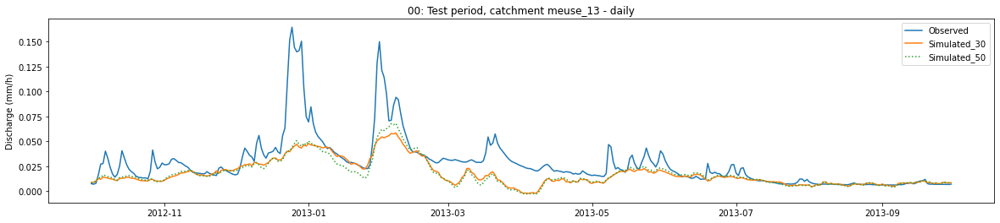

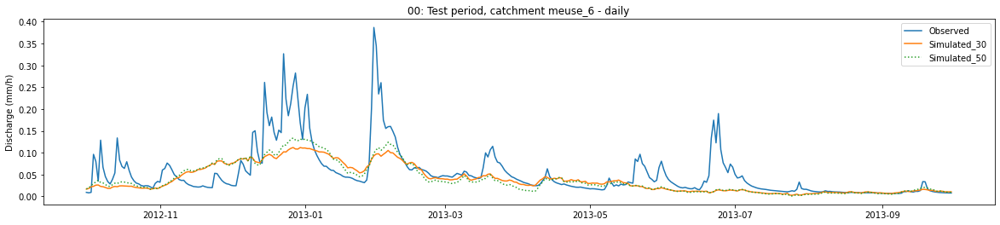

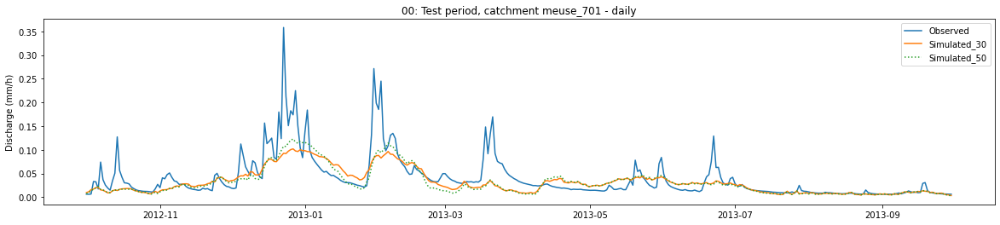

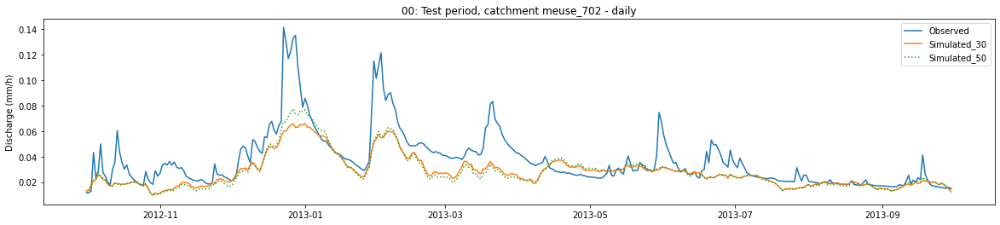

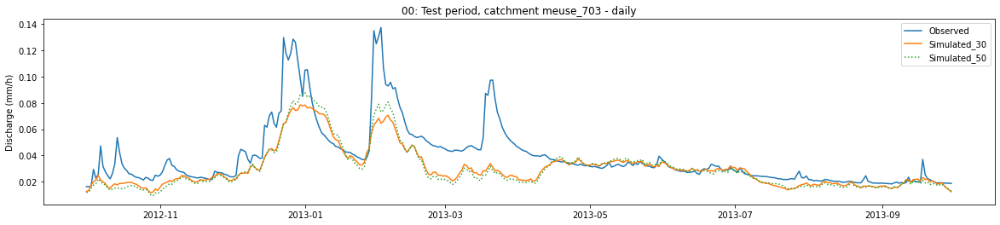

...

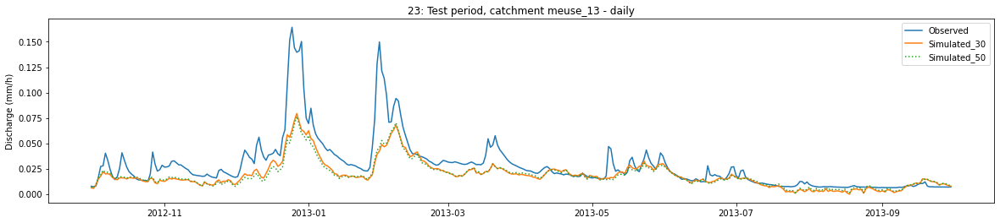

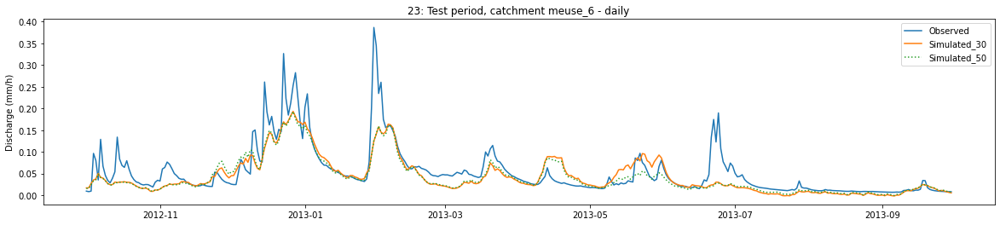

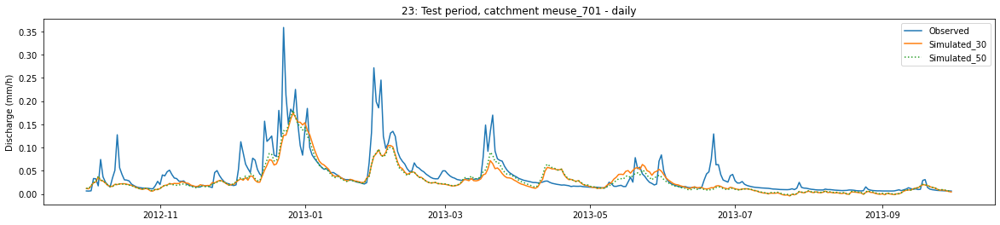

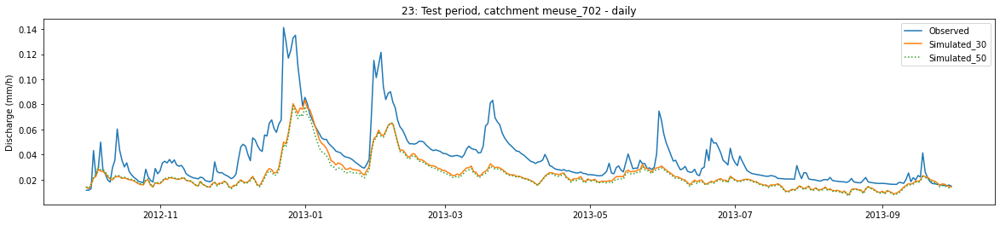

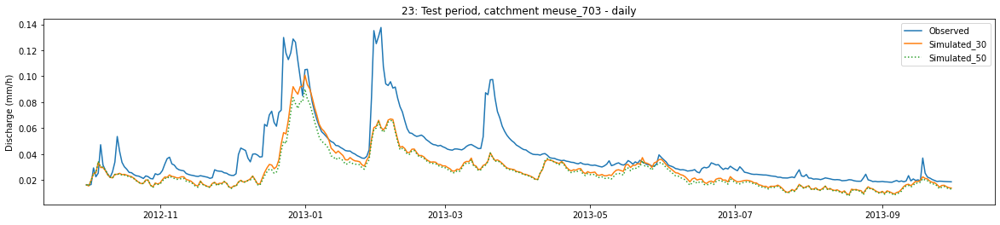

In [31]:
 # change path accordingly
files = [name for name in os.listdir(Path('C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)'))][:-1] 

# to compare results after epoch 30 and after epoch 50
epoch = ['30', '50']


plot_dir = Path('C:/Users/kwilbrand/Katharina/My_MTS-LSTM/runs/time-series_plots_meuse_training')   # change path accordingly
if plot_dir.exists() == False:
    os.mkdir(plot_dir)

metrics_df = pd.DataFrame()
    
for file in files:
    
     # change paths accordingly
    fp30 = 'C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)/' + file + '/validation/model_epoch030/validation_results.p'
    fp50 = 'C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)/' + file + '/validation/model_epoch050/validation_results.p'
    
    with open(fp30, 'rb') as f:
        results30 = pickle.load(f)
    with open(fp50, 'rb') as f:
        results50 = pickle.load(f)

    for catchm_ID in results30.keys():
        if catchm_ID.startswith('meuse'):
            # extract observations and simulations
            daily_qobs = results30[catchm_ID]["1D"]["xr"]["qobs_obs"]
            daily_qsim_30 = results30[catchm_ID]["1D"]["xr"]["qobs_sim"]
            daily_qsim_50 = results50[catchm_ID]["1D"]["xr"]["qobs_sim"]

            fig, ax = plt.subplots(figsize=(20,4))
            ax.plot(daily_qobs["date"], daily_qobs, label="Observed")
            ax.plot(daily_qsim_30["date"], daily_qsim_30, label="Simulated_30")
            ax.plot(daily_qsim_50["date"], daily_qsim_50, label="Simulated_50", ls=':')
            ax.legend()
            ax.set_ylabel("Discharge (mm/h)")
            ax.set_title(f"{file[0:2]}: Test period, catchment {catchm_ID} - daily")
            plt.savefig(str(plot_dir) + '/daily_' + file[0:2] + '_' + catchm_ID)

            # Calculate some metrics
            for i, daily_qsim in enumerate([daily_qsim_30, daily_qsim_50]):
                values = metrics.calculate_all_metrics(daily_qobs.isel(time_step=-1), daily_qsim.isel(time_step=-1))
                values['nr'] = file[0:2]
                values['catchment'] = catchm_ID
                values['epoch'] = epoch[i]
                df_temp = pd.DataFrame(values, index=[file[0:2] + catchm_ID + '_' + epoch[i]])
                metrics_df = metrics_df.append(other=df_temp)


with open(str(run_dir) + '/metrics_df_daily.pkl', 'wb') as f:
    pickle.dump(metrics_df, f, pickle.DEFAULT_PROTOCOL)

print("Daily metrics:")
metrics_df

In [16]:
# # use this code cell to reload caluclated metrics

# with open(str(run_dir) + '/metrics_df_daily.pkl', 'rb') as f:
#     metrics_df = pickle.load(f)
# metrics_df

,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,nr,catchment,epoch
00meuse_13_30,0.353494,0.000426,0.020651,0.332982,0.496415,-0.410440,0.773932,-62.248109,13.925442,-2383.580124,2.500000,00,meuse_13,30
00meuse_13_50,0.379273,0.000409,0.020235,0.356407,0.524223,-0.413918,0.787271,-56.381488,2.502484,-2335.889226,2.500000,00,meuse_13,50
00meuse_6_30,0.358472,0.002107,0.045907,0.368863,0.542287,-0.254593,0.661426,-63.368605,31.268123,-109.260228,1.333333,00,meuse_6,30
00meuse_6_50,0.426764,0.001883,0.043395,0.437118,0.600623,-0.250893,0.707980,-56.724126,26.003527,-237.652299,1.333333,00,meuse_6,50
00meuse_701_30,0.461078,0.001114,0.033377,0.432665,0.551532,-0.189397,0.726283,-59.115072,-7.848324,-83.514390,0.500000,00,meuse_701,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23meuse_701_50,0.593268,0.000841,0.028996,0.544225,0.674798,-0.231315,0.816635,-35.286055,-4.019432,-1571.849922,1.000000,23,meuse_701,50
23meuse_702_30,0.325829,0.000328,0.018113,0.460050,0.612522,-0.578460,0.845381,-39.259262,-30.248838,-4.249848,0.333333,23,meuse_702,30
23meuse_702_50,0.258485,0.000361,0.018997,0.418105,0.576942,-0.627188,0.853389,-42.952896,-33.610013,-23.130862,0.333333,23,meuse_702,50
23meuse_703_30,0.478172,0.000292,0.017086,0.546705,0.681279,-0.482163,0.862197,-28.895969,-4.806343,-81.808415,2.000000,23,meuse_703,30


In [102]:
metrics_df.drop(columns='MSE', inplace=True)
metrics_df.drop(columns='RMSE', inplace=True)
metrics_df.drop(columns='Alpha-NSE', inplace=True)
metrics_df.drop(columns='Beta-NSE', inplace=True)
metrics_df.drop(columns='FMS', inplace=True)
metrics_df.drop(columns='FLV', inplace=True)


In [95]:
max_per_nr = {}
for nr in metrics_df.nr.unique():
    x = metrics_df.loc[metrics_df.nr == nr].NSE.idxmax()
    xmin = metrics_df.loc[metrics_df.nr == nr].NSE.idxmin()
    max_per_nr[nr] = x
#     metrics_df.drop(index=xmin, inplace=True)
    print(nr, x)

00 00meuse_701_50
01 01meuse_6_50
02 02meuse_703_30
03 03meuse_703_50
04 04meuse_6_50
05 05meuse_13_30
06 06meuse_6_50
07 07meuse_6_50
08 08meuse_703_30
09 09meuse_701_50
10 10meuse_703_30
11 11meuse_6_30
12 12meuse_703_30
13 13meuse_6_50
14 14meuse_703_50
15 15meuse_703_50
16 16meuse_703_30
17 17meuse_13_30
18 18meuse_13_50
19 19meuse_6_50
20 20meuse_703_30
21 21meuse_6_50
22 22meuse_703_50
23 23meuse_6_50


## Show which run has best metric values per catchment
- NSE
- KGE
- FHV
- Peak-Timing

In [2]:
# NSE
max_per_catchm = {}
print('catchment - index - NSE - KGE - FHV - PeakTiming')
for catchm in metrics_df.catchment.unique():
    x = metrics_df.loc[metrics_df.catchment == catchm].NSE.idxmax()
    max_per_catchm[catchm] = x
    print(catchm, x, round(metrics_df.loc[x].NSE, 3), round(metrics_df.loc[x].KGE, 3), round(metrics_df.loc[x].FHV, 3), round(metrics_df.loc[x]['Peak-Timing'], 3))
    

In [89]:
# KGE
max_per_catchm = {}
print('catchment - index - NSE - KGE - FHV - PeakTiming')
for catchm in metrics_df.catchment.unique():
    x = metrics_df.loc[metrics_df.catchment == catchm].KGE.idxmax()
    max_per_catchm[catchm] = x
    print(catchm, x, round(metrics_df.loc[x].NSE, 3), round(metrics_df.loc[x].KGE, 3), round(metrics_df.loc[x].FHV, 3), round(metrics_df.loc[x]['Peak-Timing'], 3))
    

catchment - index - NSE - KGE - FHV - PeakTiming
meuse_13 05meuse_13_30 0.67 0.602 -31.49 2.5
meuse_6 11meuse_6_30 0.666 0.707 -27.851 1.667
meuse_701 20meuse_701_50 0.446 0.608 -42.804 2.0
meuse_702 21meuse_702_30 0.564 0.617 -19.316 0.333
meuse_703 08meuse_703_30 0.551 0.747 -12.035 3.0


In [92]:
# FHV
max_per_catchm = {}
print('catchment - index - NSE - KGE - FHV - PeakTiming')
for catchm in metrics_df.catchment.unique():
    x = metrics_df.loc[metrics_df.catchment == catchm]['FHV'].abs().idxmin()
    max_per_catchm[catchm] = x
    print(catchm, x, round(metrics_df.loc[x].NSE, 3), round(metrics_df.loc[x].KGE, 3), round(metrics_df.loc[x].FHV, 3), round(metrics_df.loc[x]['Peak-Timing'], 3))
    

catchment - index - NSE - KGE - FHV - PeakTiming
meuse_13 05meuse_13_30 0.67 0.602 -31.49 2.5
meuse_6 11meuse_6_50 0.625 0.668 -27.146 1.667
meuse_701 09meuse_701_30 0.621 0.528 -29.861 1.0
meuse_702 21meuse_702_30 0.564 0.617 -19.316 0.333
meuse_703 08meuse_703_30 0.551 0.747 -12.035 3.0


In [91]:
# Peak-Timing
max_per_catchm = {}
print('catchment - index - NSE - KGE - FHV - PeakTiming')
for catchm in metrics_df.catchment.unique():
    x = metrics_df.loc[metrics_df.catchment == catchm]['Peak-Timing'].idxmin()
    max_per_catchm[catchm] = x
    print(catchm, x, round(metrics_df.loc[x].NSE, 3), round(metrics_df.loc[x].KGE, 3), round(metrics_df.loc[x].FHV, 3), round(metrics_df.loc[x]['Peak-Timing'], 3))
    

catchment - index - NSE - KGE - FHV - PeakTiming
meuse_13 07meuse_13_30 0.616 0.511 -38.602 1.0
meuse_6 12meuse_6_30 0.32 0.323 -68.878 0.667
meuse_701 00meuse_701_30 0.461 0.433 -59.115 0.5
meuse_702 01meuse_702_30 0.413 0.553 -28.629 0.333
meuse_703 23meuse_703_50 0.393 0.474 -37.076 1.0


#### Mean metrics per tunign run

In [104]:
df = metrics_df.loc[metrics_df.epoch == '30']
NSE_group30 = df.groupby('nr').mean()
df = metrics_df.loc[metrics_df.epoch == '50']
NSE_group50 = df.groupby('nr').mean()

NSE_group = NSE_group30.join(NSE_group50, lsuffix='_30', rsuffix='_50')
display(NSE_group)

,NSE_30,KGE_30,Pearson-r_30,FHV_30,Peak-Timing_30,NSE_50,KGE_50,Pearson-r_50,FHV_50,Peak-Timing_50
nr,,,,,,,,,,
00,0.418680,0.426548,0.760404,-55.072845,1.800000,0.450022,0.477939,0.772819,-48.200052,1.533333
01,0.504212,0.526496,0.811859,-39.185899,1.333333,0.531552,0.551936,0.821543,-36.102590,1.233333
02,0.420225,0.425778,0.766732,-56.064252,1.800000,0.461225,0.464775,0.796783,-49.472508,1.866667
03,0.511361,0.514021,0.828400,-40.049848,1.300000,0.533067,0.520343,0.841664,-38.668763,1.400000
04,0.339726,0.412930,0.743396,-55.221820,1.733333,0.354043,0.427463,0.748366,-51.011076,1.800000
05,0.550826,0.552128,0.835676,-36.193016,1.466667,0.463387,0.467435,0.835379,-42.033668,1.533333
06,0.451857,0.459526,0.780091,-53.812540,1.600000,0.432282,0.453537,0.789308,-51.360231,1.633333
07,0.601811,0.575543,0.858413,-33.685131,1.266667,0.616239,0.582326,0.867465,-33.223267,1.266667
08,0.430488,0.527084,0.747735,-41.051337,1.833333,0.402903,0.486657,0.752596,-45.404461,1.966667


#### metrics for best hyperparameter tuning run: run nr 21


In [23]:
metrics_df.loc[metrics_df.nr == '21']

,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,nr,catchment,epoch
21meuse_13_30,0.558389,0.000291,0.017067,0.434622,0.554331,-0.365727,0.901472,-50.473776,-24.240639,-2463.427231,2.500000,21,meuse_13,30
21meuse_13_50,0.590575,0.000270,0.016434,0.464908,0.590309,-0.363316,0.907184,-48.240271,-10.425558,-2379.461051,2.500000,21,meuse_13,50
21meuse_6_30,0.660331,0.001116,0.033404,0.674468,0.788244,-0.168708,0.831038,-31.202691,3.300616,-1195.205319,2.000000,21,meuse_6,30
21meuse_6_50,0.664489,0.001102,0.033199,0.685004,0.804898,-0.170769,0.833343,-29.022513,11.484580,-1312.911299,2.000000,21,meuse_6,50
21meuse_701_30,0.605482,0.000816,0.028558,0.574314,0.683946,-0.188634,0.810624,-38.584721,-15.727407,-153.484064,0.500000,21,meuse_701,30
21meuse_701_50,0.637859,0.000749,0.027361,0.603613,0.709099,-0.183292,0.828006,-34.295198,-14.479121,-128.418911,0.500000,21,meuse_701,50
21meuse_702_30,0.563872,0.000212,0.014569,0.616980,0.739346,-0.419990,0.870294,-19.316081,-35.305474,9.711227,0.333333,21,meuse_702,30
21meuse_702_50,0.562030,0.000213,0.014600,0.608756,0.732470,-0.437613,0.880615,-19.324787,-36.714036,2.611534,0.333333,21,meuse_702,50
21meuse_703_30,0.651963,0.000195,0.013954,0.678592,0.777628,-0.324140,0.875569,-14.843790,-26.027353,-78.990014,2.000000,21,meuse_703,30
21meuse_703_50,0.660751,0.000190,0.013777,0.694502,0.806186,-0.341503,0.885224,-12.418253,-19.388379,-104.486243,2.000000,21,meuse_703,50


### Same for Hourly Results

<ipython-input-39-b532965581d5>:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(20,4))


Hourly metrics:


,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,nr,catchment,epoch
00meuse_13_30,0.309882,0.000462,0.021497,0.344338,0.527978,-0.329014,0.659964,-45.027395,-33.327695,-156.197440,NaN,00,meuse_13,30
00meuse_13_50,0.309882,0.000462,0.021497,0.344338,0.527978,-0.329014,0.659964,-45.027395,-33.327695,-156.197440,NaN,00,meuse_13,50
00meuse_6_30,0.548816,0.001554,0.039415,0.501327,0.635561,-0.250788,0.799017,-54.868169,23.620163,-1374.333949,NaN,00,meuse_6,30
00meuse_6_50,0.548816,0.001554,0.039415,0.501327,0.635561,-0.250788,0.799017,-54.868169,23.620163,-1374.333949,NaN,00,meuse_6,50
00meuse_701_30,0.409196,0.001310,0.036188,0.458016,0.624704,-0.169071,0.662743,-51.116563,-27.361044,-54.039272,NaN,00,meuse_701,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23meuse_701_50,0.418093,0.001290,0.035915,0.683873,0.997622,-0.117305,0.715252,-4.020058,13.209064,-1015.225198,NaN,23,meuse_701,50
23meuse_702_30,0.316024,0.000344,0.018553,0.418587,0.556869,-0.587401,0.871989,-39.363082,-25.312148,-1756.090824,NaN,23,meuse_702,30
23meuse_702_50,0.316024,0.000344,0.018553,0.418587,0.556869,-0.587401,0.871989,-39.363082,-25.312148,-1756.090824,NaN,23,meuse_702,50
23meuse_703_30,0.447399,0.000315,0.017760,0.470106,0.577494,-0.486081,0.880678,-36.681902,-10.270075,-138.457230,NaN,23,meuse_703,30


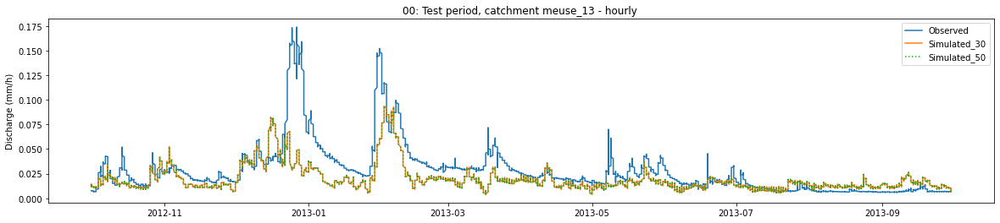

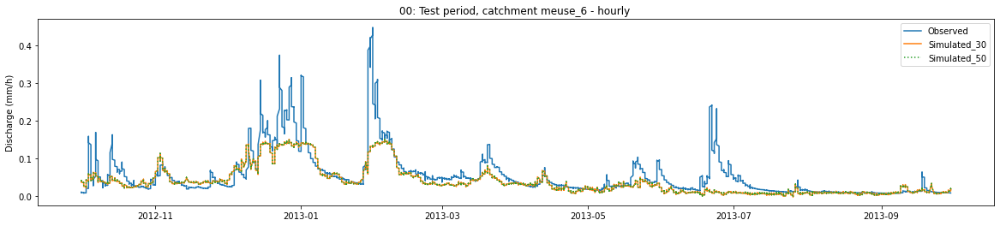

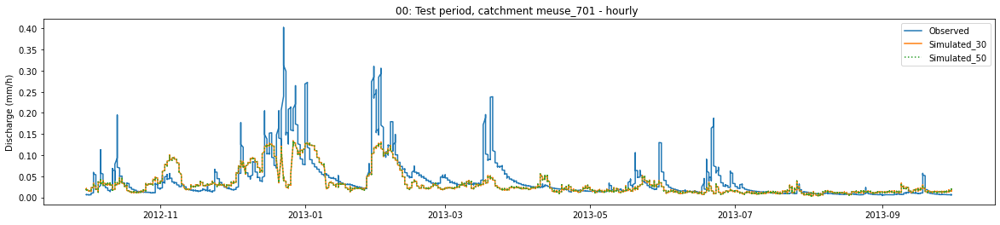

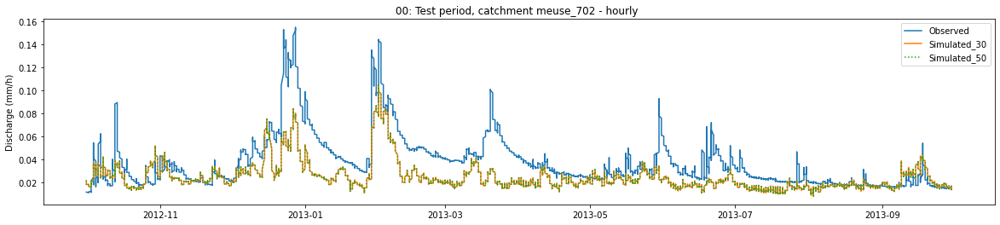

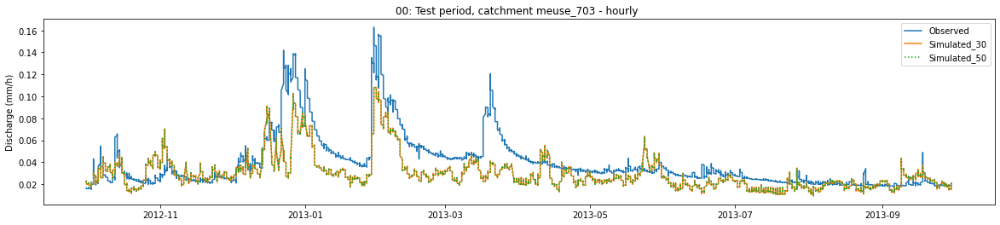

...

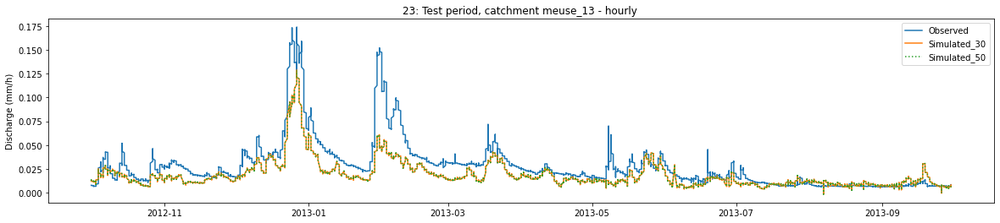

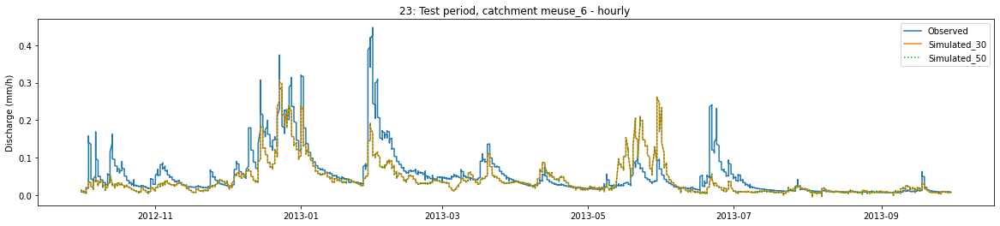

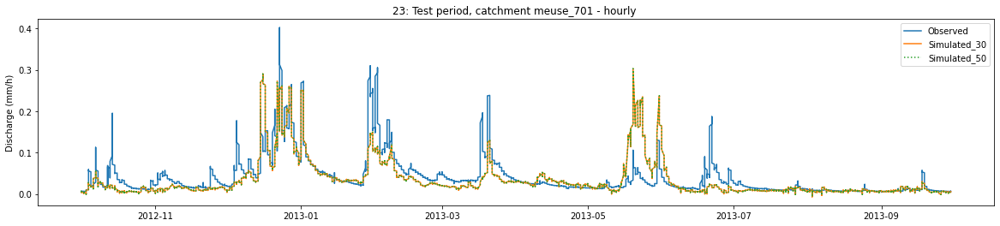

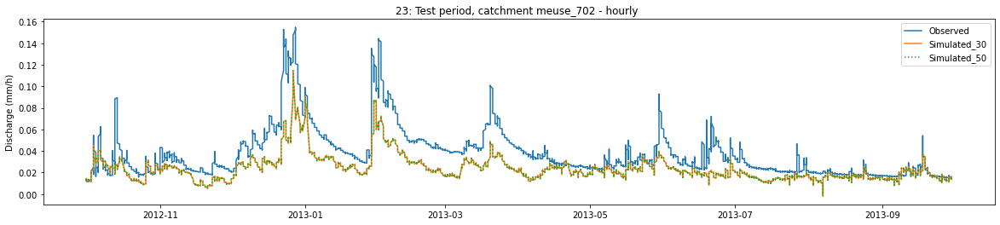

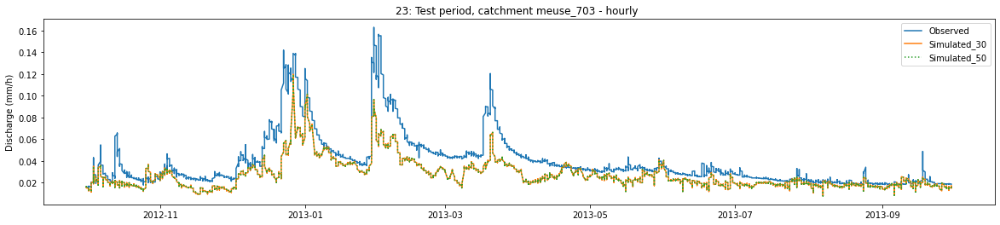

In [39]:
# change path accordingly
files = [name for name in os.listdir(Path('C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)'))][:-1]
epoch = ['30', '50']

# change path accordingly
plot_dir = Path('C:/Users/kwilbrand/Katharina/My_MTS-LSTM/runs/time-series_plots_meuse_training')
if plot_dir.exists() == False:
    os.mkdir(plot_dir)

metrics_df = pd.DataFrame()
    
for file in files:
    # change path accordingly
    fp30 = 'C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)/' + file + '/validation/model_epoch030/validation_results.p'
    fp50 = 'C:/Users/kwilbrand/Katharina/My_MTS-LSTM/tuning_europe(meuse)/' + file + '/validation/model_epoch050/validation_results.p'
    
    with open(fp30, 'rb') as f:
        results30 = pickle.load(f)
    with open(fp50, 'rb') as f:
        results50 = pickle.load(f)

    for catchm_ID in results30.keys():
        if catchm_ID.startswith('meuse'):
            # extract observations and simulations
            hourly_xr = results30[catchm_ID]["1H"]["xr"]
            hourly_xr = hourly_xr.isel(time_step=slice(-24, None)).stack(datetime=['date', 'time_step'])
            hourly_xr['datetime'] = hourly_xr.coords['date'] + hourly_xr.coords['time_step']
            
            hourly_qobs = hourly_xr["qobs_obs"]
            hourly_qsim_30 = hourly_xr["qobs_sim"]
            hourly_qsim_50 = hourly_xr["qobs_sim"]

            fig, ax = plt.subplots(figsize=(20,4))
            ax.plot(hourly_qobs["datetime"], hourly_qobs, label="Observed")
            ax.plot(hourly_qsim_30["datetime"], hourly_qsim_30, label="Simulated_30")
            ax.plot(hourly_qsim_50["datetime"], hourly_qsim_50, label="Simulated_50", ls=':')
            ax.legend()
            ax.set_ylabel("Discharge (mm/h)")
            ax.set_title(f"{file[0:2]}: Test period, catchment {catchm_ID} - hourly ")
            plt.savefig(str(plot_dir) + '/hourly' + file[0:2] + '_' + catchm_ID)

            # Calculate some metrics
            for i, hourly_qsim in enumerate([hourly_qsim_30, hourly_qsim_50]):
                values = metrics.calculate_all_metrics(hourly_qobs, hourly_qsim)
                values['nr'] = file[0:2]
                values['catchment'] = catchm_ID
                values['epoch'] = epoch[i]
                df_temp = pd.DataFrame(values, index=[file[0:2] + catchm_ID + '_' + epoch[i]])
                metrics_df = metrics_df.append(other=df_temp)


with open(str(run_dir) + '/metrics_df_hourly.pkl', 'wb') as f:
    pickle.dump(metrics_df, f, pickle.HIGHEST_PROTOCOL)

print("Hourly metrics:")
metrics_df

In [40]:
metrics_df.drop(columns='MSE', inplace=True)
metrics_df.drop(columns='RMSE', inplace=True)
metrics_df.drop(columns='Alpha-NSE', inplace=True)
metrics_df.drop(columns='Beta-NSE', inplace=True)
metrics_df.drop(columns='FMS', inplace=True)
metrics_df.drop(columns='FLV', inplace=True)

#### Mean metrics per tuning run

In [41]:
df = metrics_df.loc[metrics_df.epoch == '30']
NSE_group30 = df.groupby('nr').mean()
df = metrics_df.loc[metrics_df.epoch == '50']
NSE_group50 = df.groupby('nr').mean()

NSE_group = NSE_group30.join(NSE_group50, lsuffix='_30', rsuffix='_50')
display(NSE_group)

,NSE_30,KGE_30,Pearson-r_30,FHV_30,Peak-Timing_30,NSE_50,KGE_50,Pearson-r_50,FHV_50,Peak-Timing_50
nr,,,,,,,,,,
00,0.382331,0.442659,0.727147,-43.550253,NaN,0.382331,0.442659,0.727147,-43.550253,NaN
01,0.485145,0.496769,0.817543,-33.412136,NaN,0.485145,0.496769,0.817543,-33.412136,NaN
02,0.469905,0.474399,0.790449,-45.672065,NaN,0.469905,0.474399,0.790449,-45.672065,NaN
03,0.504994,0.495769,0.828578,-31.695914,NaN,0.504994,0.495769,0.828578,-31.695914,NaN
04,0.429231,0.465526,0.748620,-37.605420,NaN,0.429231,0.465526,0.748620,-37.605420,NaN
05,0.517227,0.564988,0.803537,-29.467799,NaN,0.517227,0.564988,0.803537,-29.467799,NaN
06,0.512599,0.568253,0.787201,-32.024218,NaN,0.512599,0.568253,0.787201,-32.024218,NaN
07,0.492868,0.468421,0.818520,-40.875688,NaN,0.492868,0.468421,0.818520,-40.875688,NaN
08,0.500429,0.527161,0.786985,-34.261693,NaN,0.500429,0.527161,0.786985,-34.261693,NaN
